In [1]:
from importlib import reload
import numpy as np
import os
import random
import pickle
import multiprocessing
import functools
import seaborn
import logging
import typhon
import cmocean
from pylab import cm
from os.path import join
from netCDF4 import Dataset
from tqdm import tqdm_notebook
from scipy.interpolate import interp1d
from scipy.signal import detrend
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import processing_tools as ptools
import analysis_tools as atools
from importlib import reload
from moisture_space import utils, plots
from moisture_space import moisture_space
logging.basicConfig(format='%(levelname)s:%(message)s', level=logging.ERROR)

# Config

In [2]:
models = ['ICON', 'NICAM', 'GEOS', 'IFS', 'MPAS', 'FV3', 'UM', 'SAM', 'ARPEGE']
runs = {
    'ICON': ['2.5km'],
    'NICAM': ['3.5km'],
    'SAM': ['4.0km'],
    'UM': ['5.0km'],
    'FV3': ['3.25km'],
    'GEOS': ['3.0km'],
    'IFS': ['4.0km', '9.0km'],
    'MPAS': ['3.75km'],
    'ARPEGE': ['2.5km']
}
exps = []
for m in models:
    for run in runs[m]:
        exps.append(m+'-'+run)
        
time_period = ['0810', '0908']
variables_3D = ['TEMP', 'PRES', 'QV', 'QI', 'QC', 'RH', 'ICQI', 'CFI', 'ICQC', 'CFL', 'W']
variables_2D = ['IWV', 'H_tropo', 'OLR', 'STOA']
datapath = '/mnt/lustre02/work/mh1126/m300773/DYAMOND/{}/random_samples/'
ocean_basins = ['Pacific', 'Atlantic', 'Indic']
sample_days = ['all', 'first10', 'last10']
filenames = '{}-{}_{}_sample_{}_{}-{}{}.nc'
num_profiles = int(1 * 1e7)
perc_values = np.arange(1, 100.5, 1.0)
reduced_percs_50 = np.arange(1.5, 100.5, 2)
reduced_percs_25 = np.arange(2.5, 100.5, 4)
num_percs = len(perc_values)
iwv_bin_bnds = np.arange(0, 101, 1)
bins = range(len(iwv_bin_bnds) - 1) 
exp = 0
h = np.arange(100, 17900, 400) # height vector to interpolate all models on
height = {}
num_levels = {}
for m in models:
    for run in runs[m]:
        key = m+'-'+run
        filename = filenames.format(m, run, variables_3D[0], num_profiles, time_period[0], time_period[1], '')
        if run == '2.5km_winter':
            filename = filenames.format(m, run, variables_3D[0], num_profiles, '0120', '0202')
        filename = join(datapath.format(m), filename)
        #xarr = xr.open_dataset(filename)
        with(Dataset(filename)) as ds:
            height[key] = ds.variables['height'][:].filled(np.nan)
        num_levels[key] = len(height[key])
        
# NICAM excluded for variablilty analysis!
variability_exclude = ['']
models_variability = [m for m in exps if not m in variability_exclude]

# Read data

In [3]:
reload(moisture_space)
perc = {}
binned = {}
ms_perc = {}
ms_bins = {}
percentiles = {}
for m in models:
    for run in runs[m]:
        exp = m+'-'+run
        print(exp)
        ms_perc[exp] = {}
        ms_bins[exp] = {}
        
        path_perc = f'{m}-{run}_{time_period[0]}-{time_period[1]}_perc_means_basins_{num_profiles}_0exp.pkl'
        path_bin = f'{m}-{run}_{time_period[0]}-{time_period[1]}_bin_means_basins_{num_profiles}_0exp.pkl'
        
        with open(join(datapath.format(m), path_perc), 'rb' ) as infile:
            perc = pickle.load(infile)
        with open(join(datapath.format(m), path_bin), 'rb' ) as infile:
            binned = pickle.load(infile)       
                    
        for scenario in sample_days:
            if scenario == 'all':
                path_perc = f'{m}-{run}_{time_period[0]}-{time_period[1]}_perc_means_{num_profiles}_1exp.pkl'
                path_bin = f'{m}-{run}_{time_period[0]}-{time_period[1]}_bin_means_{num_profiles}_1exp.pkl'
            else:
                path_perc = f'{m}-{run}_{time_period[0]}-{time_period[1]}_perc_means_{num_profiles}_{scenario}_1exp.pkl'
                path_bin = f'{m}-{run}_{time_period[0]}-{time_period[1]}_bin_means_{num_profiles}_{scenario}_1exp.pkl'
            
            with open(join(datapath.format(m), path_perc), 'rb' ) as infile:
                perc[scenario] = pickle.load(infile)
            with open(join(datapath.format(m), path_bin), 'rb' ) as infile:
                binned[scenario] = pickle.load(infile)
                
        for scenario in sample_days + ocean_basins:
            ms_perc[exp][scenario] = {}
            ms_bins[exp][scenario] = {}
            for var in variables_3D:
                stats_perc = moisture_space.ProfileStats.from_dict(perc[scenario], var)
                ms_perc[exp][scenario][var] = moisture_space.PercMoistureSpace(exp, stats_perc, perc_values, height[exp]).interpolate(h)
                stats_bin = moisture_space.ProfileStats.from_dict(binned[scenario], var)
                ms_bins[exp][scenario][var] = moisture_space.BinMoistureSpace(exp, stats_bin, perc_values, height[exp], binned[scenario]['count']).interpolate(h)
                ms_bins[exp][scenario][var].remove_empty_bins(number_threshold=300)
            for var in variables_2D:
                stats_perc = moisture_space.ProfileStats.from_dict(perc[scenario], var)
                ms_perc[exp][scenario][var] = moisture_space.PercMoistureSpace(exp, stats_perc, perc_values, None)   
                stats_bin = moisture_space.ProfileStats.from_dict(binned[scenario], var)
                ms_bins[exp][scenario][var] = moisture_space.BinMoistureSpace(exp, stats_bin, perc_values, None, binned[scenario]['count'])
                ms_bins[exp][scenario][var].remove_empty_bins(number_threshold=300)
            if 'OLR' in variables_2D and 'STOA' in variables_2D:
                if m == 'ICON':
                    ms_perc[exp][scenario]['OLR'].profile_stats.mean *= -1 
                    ms_bins[exp][scenario]['OLR'].profile_stats.mean *= -1
                if np.mean(ms_perc[exp][scenario]['STOA'].profile_stats.mean) < 0:
                    ms_perc[exp][scenario]['STOA'].profile_stats.mean *= -1
                    ms_bins[exp][scenario]['STOA'].profile_stats.mean *= -1

ICON-2.5km
NICAM-3.5km
GEOS-3.0km
IFS-4.0km
IFS-9.0km
MPAS-3.75km
FV3-3.25km
UM-5.0km
SAM-4.0km
ARPEGE-2.5km


# Collect moisture spaces

In [4]:
ms_perc_series = {}
ms_bins_series = {}
for scenario in ocean_basins+sample_days:
    ms_perc_series[scenario] = {}
    ms_bins_series[scenario] = {}
    for var in variables_3D:
        perc_space_list = [ms_perc[exp][scenario][var] for exp in models_variability]
        ms_perc_series[scenario][var] = moisture_space.MoistureSpaceSeries(perc_space_list)
    for var in variables_3D:
        bin_space_list = [ms_bins[exp][scenario][var] for exp in models_variability]
        ms_bins_series[scenario][var] = moisture_space.MoistureSpaceSeries(bin_space_list, remove_nans=True)

# IWV PDFs in different ocean basins

ICON-2.5km
NICAM-3.5km
GEOS-3.0km
IFS-4.0km
IFS-9.0km
MPAS-3.75km
FV3-3.25km
UM-5.0km
SAM-4.0km
ARPEGE-2.5km


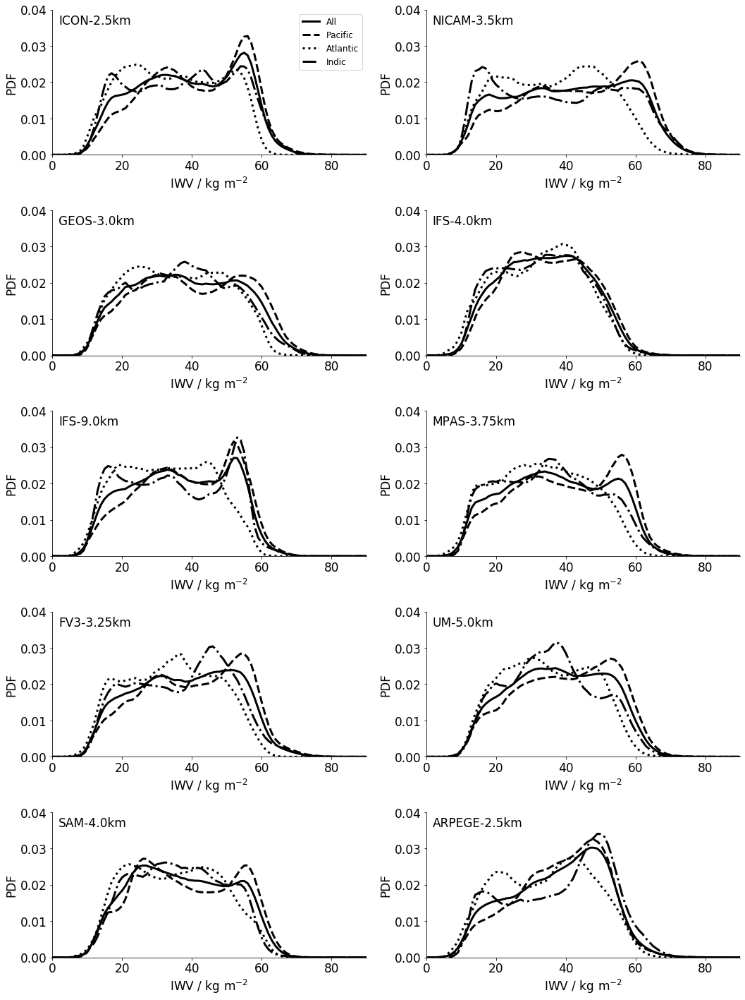

In [55]:
plt.rcParams.update({'font.size': 17})
num_cols = 2
num_rows = np.ceil(len(exps) / num_cols).astype(int)
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))
ax = ax.ravel()
for i, exp in enumerate(exps):
    print(exp)
    ax[i].set_prop_cycle(linestyle=['-', '--', ':', '-.'])
    for basin in ['all']+ocean_basins:
        iwv_pdf = ms_bins[exp][basin]['IWV'].profile_pdf
        ax[i].plot(iwv_pdf / np.sum(iwv_pdf), color='k', lw=3, label=basin.title())
        seaborn.despine()
        ax[i].set_xlabel('IWV / kg m$^{-2}$')
        ax[i].set_ylabel('PDF')
        ax[i].set_xlim(0, 90)
        ax[i].set_ylim(0, 0.04)
ax[0].legend(fontsize=12)
typhon.plots.label_axes(labels=exps)
plt.tight_layout()

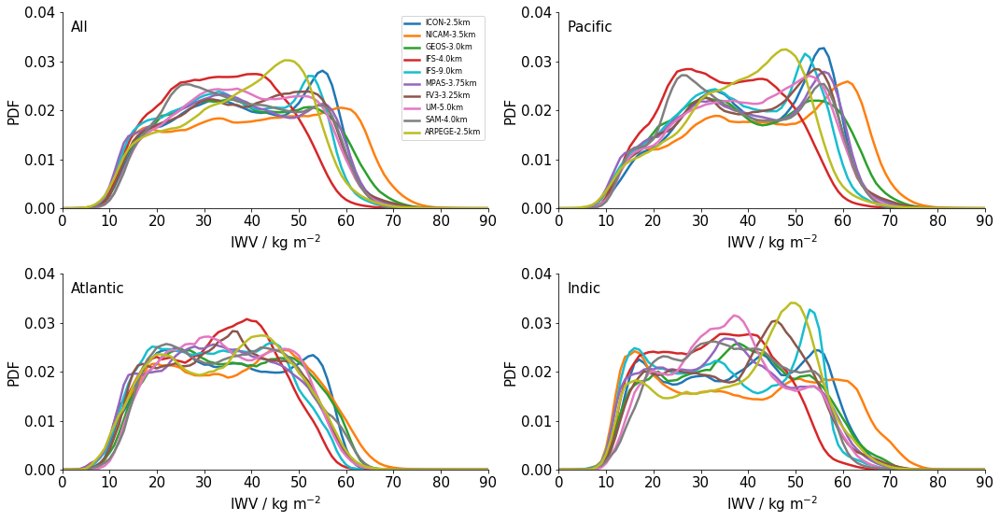

In [183]:
scenarios = ['all']+ocean_basins
num_cols = 2
num_rows = int(np.ceil(len(scenarios) / num_cols))

plt.rcParams.update({'font.size': 15})
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))

ax = ax.ravel()
for i, basin in enumerate(scenarios):
    for exp in exps:
        iwv_pdf = ms_bins[exp][basin]['IWV'].profile_pdf
        ax[i].plot(iwv_pdf / np.sum(iwv_pdf), color=plots.DYAMOND_colors(exp), lw=2.5, label=exp)
        seaborn.despine()
        ax[i].set_xlim(0, 90)
        ax[i].set_ylim(0, 0.04)
        ax[i].set_xlabel('IWV / kg m$^{-2}$')
        ax[i].set_ylabel('PDF')
#ax[i+1].set_visible(False)
typhon.plots.label_axes(labels=map(lambda s: s.title(), scenarios))
plt.tight_layout()
ax[0].legend(fontsize=8)
        

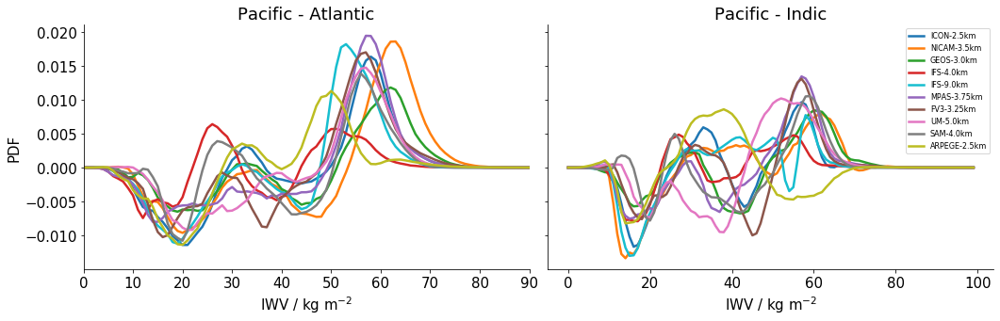

In [195]:
scenarios = ['all']+ocean_basins
num_cols = 2
num_rows = 1

plt.rcParams.update({'font.size': 15})
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 5 * num_rows), sharey=True)

ax = ax.ravel()

for exp in exps:
    iwv_pdf_pacific = ms_bins[exp]['Pacific']['IWV'].profile_pdf
    iwv_pdf_atlantic = ms_bins[exp]['Atlantic']['IWV'].profile_pdf
    iwv_pdf_indic = ms_bins[exp]['Indic']['IWV'].profile_pdf
    
    ax[0].plot(iwv_pdf_pacific / np.sum(iwv_pdf_pacific) - iwv_pdf_atlantic / np.sum(iwv_pdf_atlantic),
               color=plots.DYAMOND_colors(exp), lw=2.5, label=exp)
    ax[1].plot(iwv_pdf_pacific / np.sum(iwv_pdf_pacific) - iwv_pdf_indic / np.sum(iwv_pdf_indic),
               color=plots.DYAMOND_colors(exp), lw=2.5, label=exp)
    seaborn.despine()
    ax[0].set_xlim(0, 90)
    #ax[0].set_ylim(0, 0.04)
    ax[0].set_xlabel('IWV / kg m$^{-2}$')
    ax[1].set_xlabel('IWV / kg m$^{-2}$')
    ax[0].set_title('Pacific - Atlantic')
    ax[1].set_title('Pacific - Indic')
    ax[0].set_ylabel('PDF')
#ax[i+1].set_visible(False)

plt.tight_layout()
ax[1].legend(fontsize=8)

# Mean profiles

DEBUG:vmin 0.001565965353252829 vmax 23.54667053337918
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0016968912762384822 vmax 23.267707352930504
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0013638506091761913 vmax 23.72194475449621
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0015078583525945679 vmax 23.87992860689037
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0016616451505420567 vmax 22.682059142573166
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.001565965353252829 vmax 23.54667053337918
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.001565965353252829 vmax 23.54667053337918
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.

DEBUG:vmin 0.0016616451505420567 vmax 22.682059142573166
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0016616451505420567 vmax 22.682059142573166
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001565965353252829 vmax 23.54667053337918
DEBUG:ticklocs array

DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.0016616451505420567 vmax 22.682059142573166
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0016616451505420567 vmax 22.682059142573166
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0016616451505420567 vmax 22.682059142573166
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEBUG:vmin 0.0015714135143589172 vmax 23.64933094299129
DEBUG:ticklocs array([1.e-05, 1.e-03, 1.e-01, 1.e+01, 1.e+03, 1.e+05])
DEB

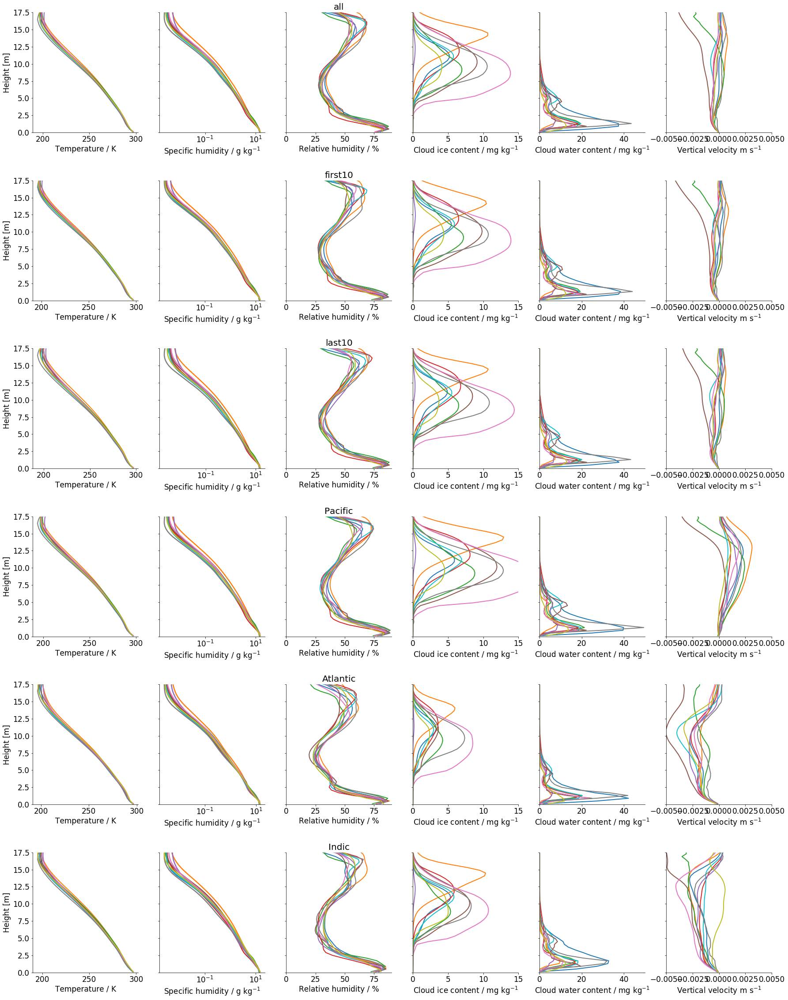

In [72]:
plt.rcParams.update({'font.size': 15})
reload(plots)
plot_vars = ['TEMP', 'QV', 'RH', 'QI', 'QC', 'W']
num_vars = len(plot_vars)
bin_start= 0
bin_end = 100
plt.rcParams.update({'font.size': 17})
fig, ax = plt.subplots(6, num_vars, figsize=(5 * num_vars, 40), sharey=True)
for n, basin in enumerate(sample_days+ocean_basins):
    for i, var in enumerate(plot_vars):
        for exp in exps:
            if var == 'QV':
                ax[n, i].semilogx(ms_perc[exp][basin][var].mean_profile(bin_start, bin_end) * plots.scaling_factors(var),\
                           h * 1e-3, lw=2.5, label=exp, color=plots.DYAMOND_colors(exp))
            else:
                ax[n, i].plot(ms_perc[exp][basin][var].mean_profile(bin_start, bin_end) * plots.scaling_factors(var),\
                           h * 1e-3, lw=2, label=exp, color=plots.DYAMOND_colors(exp))
            ax[n, i].set_xlabel(plots.axis_labels(var))
            ax[n, i].set_ylim(0, 17.5)
            ax[n, 2].set_xlim(0, 90)
            ax[n, 3].set_xlim(0, 15)
            ax[n, 4].set_xlim(0, 50)
            ax[n, 5].set_xlim(-0.005, 0.005)
            seaborn.despine(ax=ax[n, i])
    ax[n, 2].set_title(basin, fontsize=20)
    ax[n, 0].set_ylabel('Height [m]')

plt.subplots_adjust(hspace=0.4)

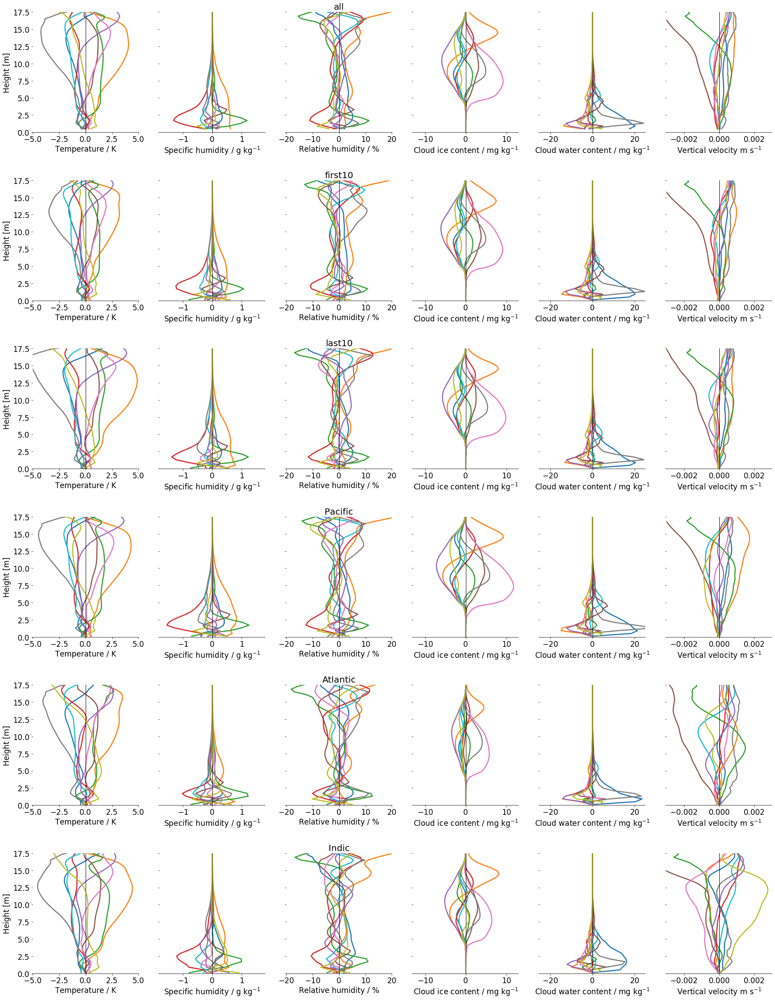

In [71]:
plt.rcParams.update({'font.size': 15})
reload(plots)
plot_vars = ['TEMP', 'QV', 'RH', 'QI', 'QC', 'W']
num_vars = len(plot_vars)
bin_start= 0
bin_end = 100
plt.rcParams.update({'font.size': 17})
fig, ax = plt.subplots(6, num_vars, figsize=(5 * num_vars, 40), sharey=True)
for n, basin in enumerate(sample_days+ocean_basins):
    for i, var in enumerate(plot_vars):
        for exp in exps:
            ax[n, i].plot((ms_perc[exp][basin][var].mean_profile(bin_start, bin_end) - np.mean(np.mean(ms_perc_series[basin][var].space_array[:, bin_start:bin_end], axis=1), axis=0)) * plots.scaling_factors(var),\
                           h * 1e-3, lw=2.5, label=exp, color=plots.DYAMOND_colors(exp))
            ax[n, i].set_xlabel(plots.axis_labels(var))
            ax[n, i].plot([0, 0], [0, 17.5], color='k', lw=0.5)
            ax[n, i].set_ylim(0, 17.5)
            ax[n, 0].set_xlim(-5, 5)
            ax[n, 1].set_xlim(-1.8, 1.8)
            ax[n, 2].set_xlim(-20, 20)
            ax[n, 3].set_xlim(-13, 13)
            ax[n, 4].set_xlim(-25, 25)
            ax[n, 5].set_xlim(-0.003, 0.003)
            seaborn.despine(ax=ax[n, i], left=True)
    ax[n, 2].set_title(basin, fontsize=20)
    ax[n, 0].set_ylabel('Height [m]')
plt.subplots_adjust(hspace=0.4)

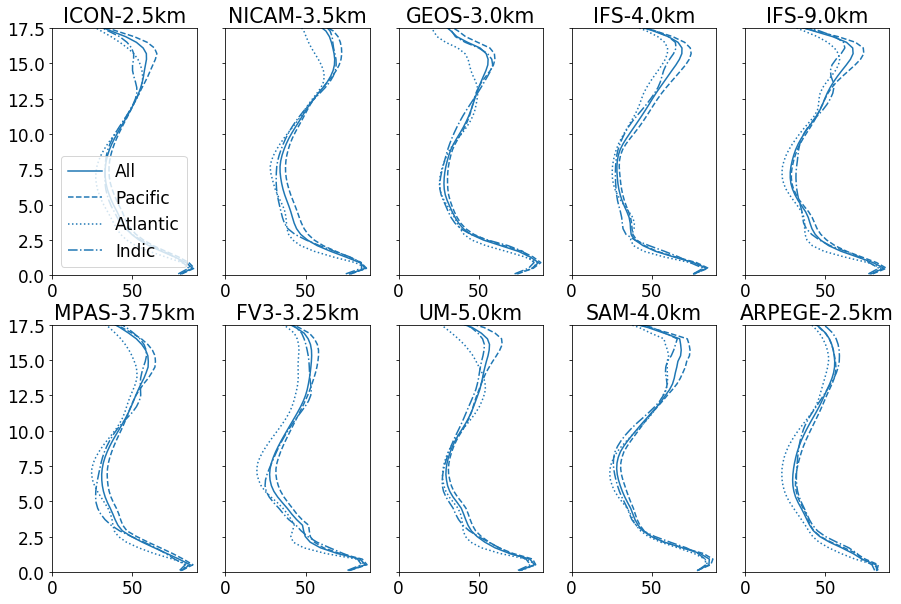

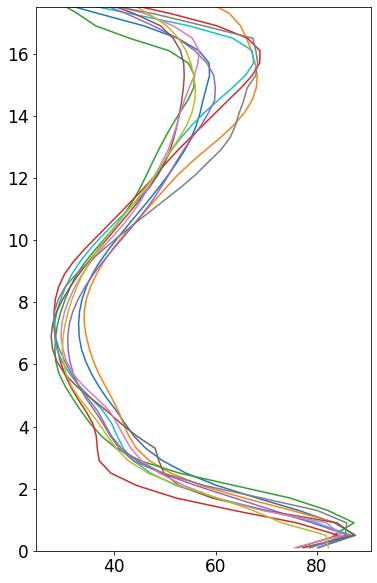

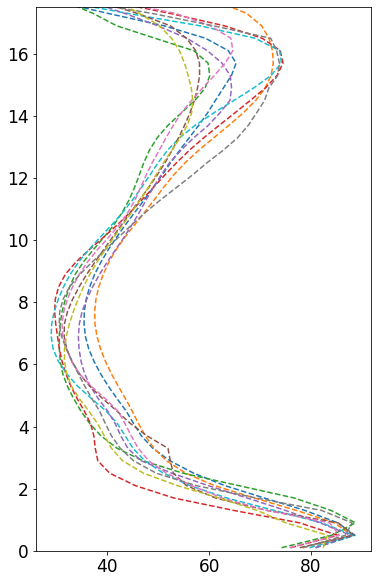

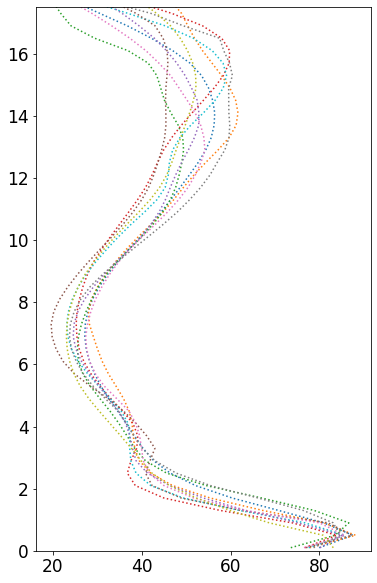

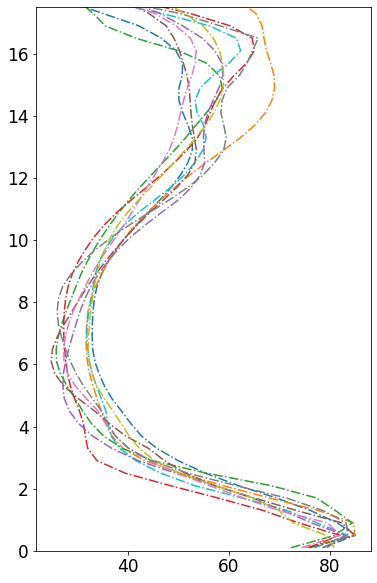

In [159]:
plt.rcParams.update({'font.size': 15})
reload(plots)
num_vars = len(plot_vars)
bin_start= 0
bin_end = 100
plt.rcParams.update({'font.size': 17})
fig, ax = plt.subplots(2, 5, figsize=(15, 10), sharey=True)
ax = ax.ravel()
for i, exp in enumerate(exps):
    ax[i].set_prop_cycle(linestyle=['-', '--', ':', '-.'])
    ax[i].set_title(exp)
    ax[i].set_ylim(0, 17.5)
    ax[i].set_xlim(0, 90)
    for b in ['all']+ocean_basins:
        ax[i].plot(ms_perc[exp][b]['RH'].mean_profile(bin_start, bin_end) * 1e2, h * 1e-3, label=b.title())
        
ax[0].legend()      
linestyle = {
    'all': '-',
    'Pacific': '--',
    'Atlantic': ':',
    'Indic': '-.'
}

for b in ['all']+ocean_basins:
    fig, ax = plt.subplots(figsize=(6, 10))
    for exp in exps:
        ax.set_ylim(0, 17.5)
        #ax[i].set_xlim(1e-3, 2e1)

        ax.plot(ms_perc[exp][b]['RH'].mean_profile(bin_start, bin_end) * 1e2, h * 1e-3, label=b.title(), color=plots.DYAMOND_colors(exp), ls=linestyle[b])

DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin

DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0

DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0

DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])
DEBUG:vmin 0.001 vmax 20.0
DEBUG:ticklocs array([], dtype=float64)


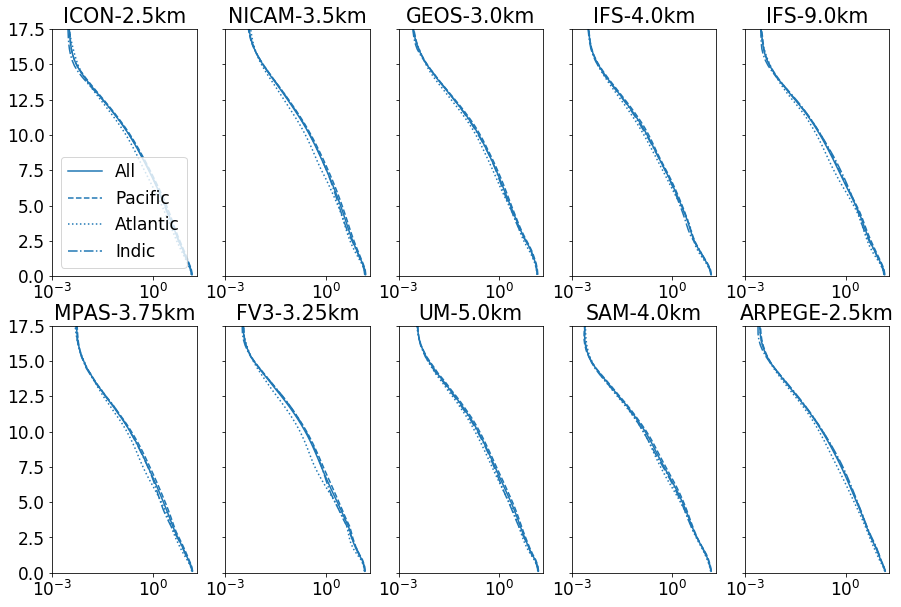

DEBUG:vmin 1.5078583525945662e-06 vmax 0.023879928606890383
DEBUG:ticklocs array([1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00])
DEBUG:vmin 1.5078583525945662e-06 vmax 0.023879928606890383
DEBUG:ticklocs array([1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00])
DEBUG:vmin 1.5078583525945662e-06 vmax 0.023879928606890383
DEBUG:ticklocs array([1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00])
DEBUG:vmin 1.5078583525945662e-06 vmax 0.023879928606890383
DEBUG:ticklocs array([2.e-07, 3.e-07, 4.e-07, 5.e-07, 6.e-07, 7.e-07, 8.e-07, 9.e-07,
       2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06, 7.e-06, 8.e-06, 9.e-06,
       2.e-05, 3.e-05, 4.e-05, 5.e-05, 6.e-05, 7.e-05, 8.e-05, 9.e-05,
       2.e-04, 3.e-04, 4.e-04, 5.e-04, 6.e-04, 7.e-04, 8.e-04, 9.e-04,
       2.e-03, 3.e-03, 4.e-03, 5.e-03, 6.e-03, 7.e-03, 8.e-03, 9.e-03,
       2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e

DEBUG:vmin 1.5078583525945662e-06 vmax 0.023879928606890383
DEBUG:ticklocs array([1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00])
DEBUG:vmin 1.5078583525945662e-06 vmax 0.023879928606890383
DEBUG:ticklocs array([1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00])
DEBUG:vmin 1.5078583525945662e-06 vmax 0.023879928606890383
DEBUG:ticklocs array([2.e-07, 3.e-07, 4.e-07, 5.e-07, 6.e-07, 7.e-07, 8.e-07, 9.e-07,
       2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06, 7.e-06, 8.e-06, 9.e-06,
       2.e-05, 3.e-05, 4.e-05, 5.e-05, 6.e-05, 7.e-05, 8.e-05, 9.e-05,
       2.e-04, 3.e-04, 4.e-04, 5.e-04, 6.e-04, 7.e-04, 8.e-04, 9.e-04,
       2.e-03, 3.e-03, 4.e-03, 5.e-03, 6.e-03, 7.e-03, 8.e-03, 9.e-03,
       2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e-01, 9.e-01,
       2.e+00, 3.e+00, 4.e+00, 5.e+00, 6.e+00, 7.e+00, 8.e+00, 9.e+00])


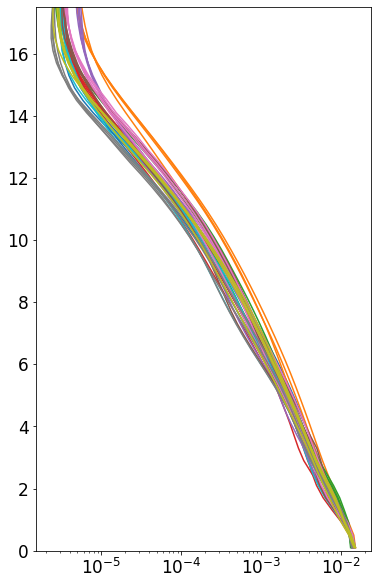

In [153]:
plt.rcParams.update({'font.size': 15})
reload(plots)
num_vars = len(plot_vars)
bin_start= 0
bin_end = 100
plt.rcParams.update({'font.size': 17})
fig, ax = plt.subplots(2, 5, figsize=(15, 10), sharey=True)
ax = ax.ravel()
for i, exp in enumerate(exps):
    ax[i].set_prop_cycle(linestyle=['-', '--', ':', '-.'])
    ax[i].set_title(exp)
    ax[i].set_ylim(0, 17.5)
    ax[i].set_xlim(1e-3, 2e1)
    for b in ['all']+ocean_basins:
        ax[i].semilogx(ms_perc[exp][b]['QV'].mean_profile(bin_start, bin_end) * 1e3, h * 1e-3, label=b.title())
        
ax[0].legend()  

fig, ax = plt.subplots(figsize=(6, 10))
for exp in exps:
    ax.set_ylim(0, 17.5)
    #ax[i].set_xlim(1e-3, 2e1)
    for b in ['all']+ocean_basins:
        ax.semilogx(ms_perc[exp][b]['QV'].mean_profile(bin_start, bin_end), h * 1e-3, label=b.title(), color=plots.DYAMOND_colors(exp))

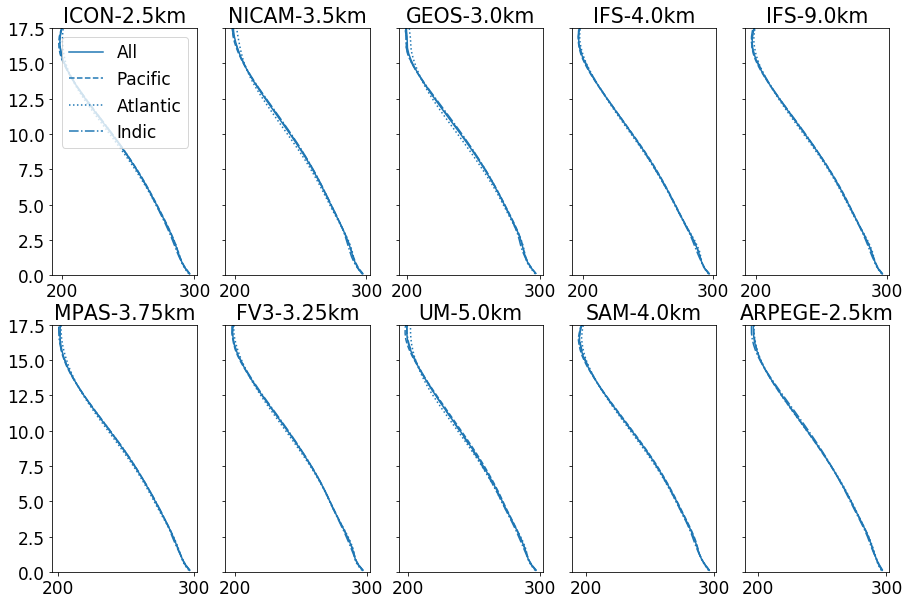

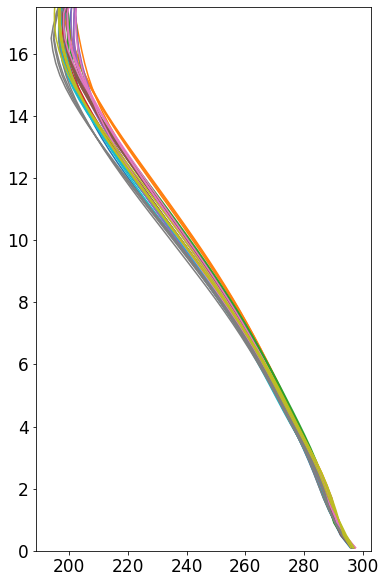

In [152]:
plt.rcParams.update({'font.size': 15})
reload(plots)
num_vars = len(plot_vars)
bin_start= 0
bin_end = 100
plt.rcParams.update({'font.size': 17})
fig, ax = plt.subplots(2, 5, figsize=(15, 10), sharey=True)
ax = ax.ravel()
for i, exp in enumerate(exps):
    ax[i].set_prop_cycle(linestyle=['-', '--', ':', '-.'])
    ax[i].set_title(exp)
    ax[i].set_ylim(0, 17.5)
    #ax[i].set_xlim(1e-3, 2e1)
    for b in ['all']+ocean_basins:
        ax[i].plot(ms_perc[exp][b]['TEMP'].mean_profile(bin_start, bin_end), h * 1e-3, label=b.title())
        
ax[0].legend() 

fig, ax = plt.subplots(figsize=(6, 10))
for exp in exps:
    ax.set_ylim(0, 17.5)
    #ax[i].set_xlim(1e-3, 2e1)
    for b in ['all']+ocean_basins:
        ax.plot(ms_perc[exp][b]['TEMP'].mean_profile(bin_start, bin_end), h * 1e-3, label=b.title(), color=plots.DYAMOND_colors(exp))
        
 

# Multi-model means

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c64a58f60>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c64cec6d8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c64d3db38>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c64fc16d8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c6500aba8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c65290208>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c652cacf8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

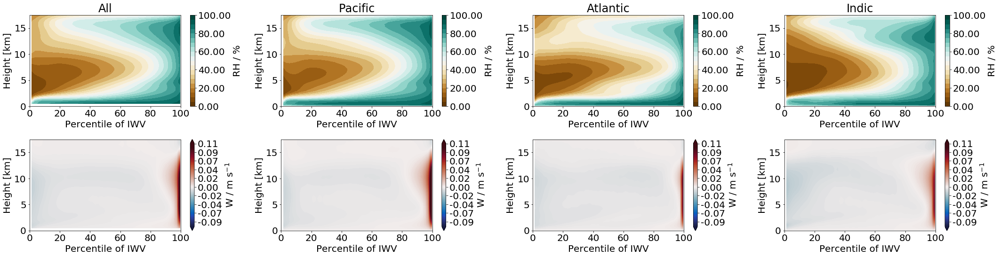

In [187]:
num_cols = 4
num_rows = 2
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))

tick_labels = np.arange(10, 81, 10)

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'
contours_w = np.arange(-0.1, 0.11, 0.001)

for n, basin in enumerate(['all']+ocean_basins):
    ax[0, n].set_title(basin.title())
    plots.moisture_space_contourf(fig, ax[0, n], reduced_percs_50, h * 1e-3, ms_perc_series[basin]['RH'].reduced_bins(50).T * 1e2, np.arange(0, 101, 5),\
                                  x_lims, y_lims, x_label, y_label, 'RH / %',
                                  cm_orientation='vertical', cb_extend='neither', cb_ticks=np.arange(0, 101, 20), \
                                  cmap='BrBG', vmin=0, vmax=100)
#     plots.moisture_space_contourf(fig, ax[1, n], perc_values, h * 1e-3, ms_perc_series[basin]['RH'].variability.T * 1e2, np.arange(0, 11, 1),\
#                                   x_lims, y_lims, x_label, y_label, 'RH Std / %',
#                                   cm_orientation='vertical', cb_extend='neither', cb_ticks=np.arange(0, 11, 10), \
#                                   cmap='Reds', vmin=0, vmax=10)
    plots.moisture_space_contourf(fig, ax[1, n], reduced_percs_50, h * 1e-3, ms_perc_series[basin]['W'].reduced_bins(50).T, contours_w,\
                              x_lims, y_lims, x_label, y_label, 'W / m s$^{-1}$',
                              cm_orientation='vertical', cb_extend='both', \
                              cmap='difference', vmin=-0.1, vmax=0.1)
plt.tight_layout()

# OLR in different ocean basins

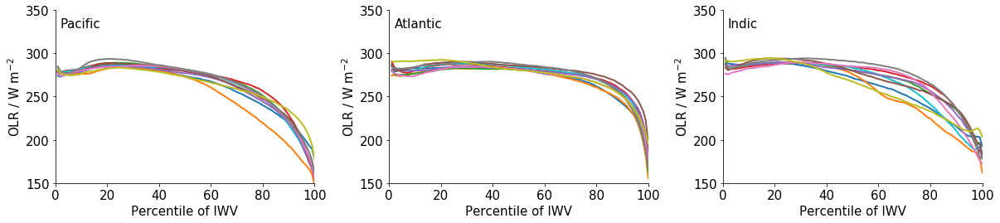

In [58]:
plt.rcParams.update({'font.size': 15})
x_lims = [0, 100]
y_lims = [150, 350]
fig, ax = plt.subplots(1, 3, figsize=(17, 4))
for i, basin in enumerate(ocean_basins):
    for exp in exps:
        plots.moisture_space_line(ax[i], perc_values, ms_perc[exp][basin]['OLR'].mean,\
                                  x_lims, y_lims, 'Percentile of IWV', 'OLR / W m$^{-2}$', color=plots.DYAMOND_colors(exp), lw=2, label=exp)
        seaborn.despine()
typhon.plots.label_axes(labels=ocean_basins)
plt.tight_layout()

# RH distribution in different ocean basins

In [138]:
reduced_percs_25

array([ 2.5,  6.5, 10.5, 14.5, 18.5, 22.5, 26.5, 30.5, 34.5, 38.5, 42.5,
       46.5, 50.5, 54.5, 58.5, 62.5, 66.5, 70.5, 74.5, 78.5, 82.5, 86.5,
       90.5, 94.5, 98.5])

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5860d9b0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c6255d860>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c61220da0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5903a9e8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c62415e80>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c56324f98>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5680ad30>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

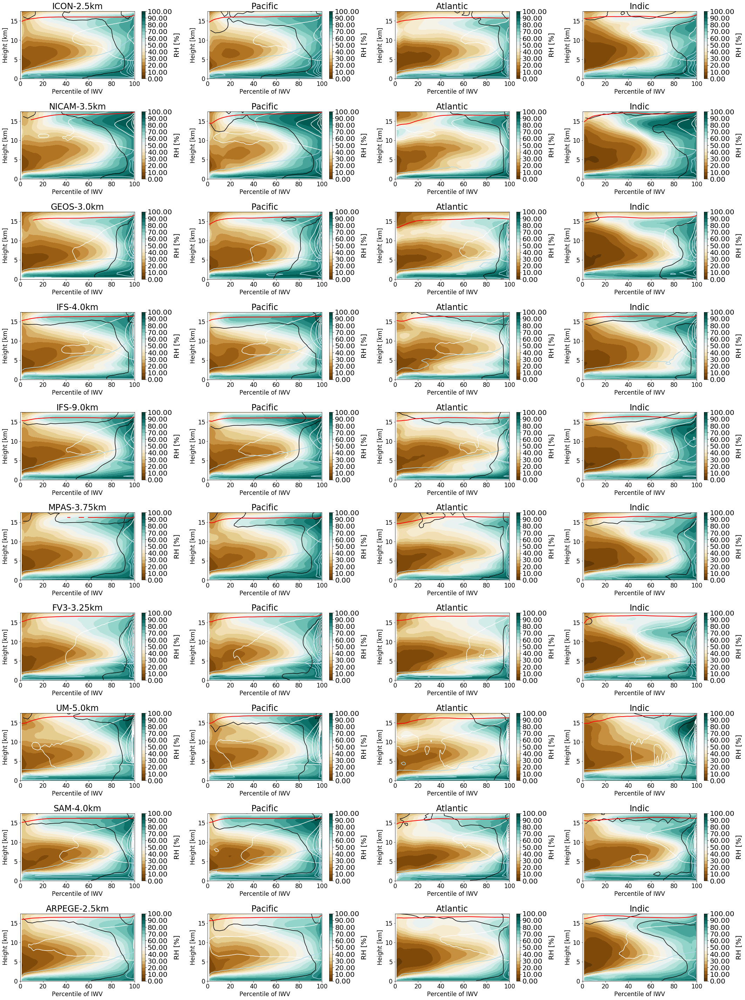

In [139]:
reload(moisture_space)
num_cols = 4
num_rows = len(exps)
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))
tick_labels = np.arange(10, 81, 10)

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'
contours = np.arange(0, 101, 5)
contours_ci = np.arange(1, 200, 20)
contours_cl = np.arange(1, 150, 20)


for i, exp in enumerate(exps):
    for n, basin in enumerate(['all']+ocean_basins):
        ax[i, n].set_title(f'{basin}')
        plots.moisture_space_contourf(fig, ax[i, n], reduced_percs_50, h * 1e-3, (ms_perc[exp][basin]['RH'].reduced_bins(50).T) * 1e2, contours,\
                                      x_lims, y_lims, x_label, y_label, 'RH [%]',
                                      cm_orientation='vertical', cb_extend='neither', cb_ticks=np.arange(0, 110, 10),\
                                      cmap='BrBG', vmin=0, vmax=100)

        ci = plots.moisture_space_contour(fig, ax[i, n], reduced_percs_50, h * 1e-3, ms_perc[exp][basin]['QI'].reduced_bins(50).T * 1e6, contours_ci,\
                                      x_lims, y_lims, x_label, y_label, 'w')
        cl = plots.moisture_space_contour(fig, ax[i, n], reduced_percs_50, h * 1e-3, ms_perc[exp][basin]['QC'].reduced_bins(50).T * 1e6, contours_cl,\
                                       x_lims, y_lims, x_label, y_label, 'lightblue')

        cs = plots.moisture_space_contour(fig, ax[i, n], reduced_percs_25, h * 1e-3, ms_perc[exp][basin]['W'].reduced_bins(25).T,\
                                 [0.0], x_lims, y_lims, x_label, y_label, 'k')
        plots.moisture_space_line(ax[i, n], reduced_percs_50, ms_perc[exp][basin]['H_tropo'].reduced_bins(50).T * 1e-3,\
                                      x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')

        ax[i, 0].set_title(exp)
        freezing_level = h[np.argmin(np.abs(ms_perc[exp][basin]['TEMP'].mean - 273.15), axis=1)] 
        #ax[i].plot(perc_values[80:100], freezing_level[80:100] * 1e-3)

plt.tight_layout()

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c60856d30>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c60c7e470>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c614b1f28>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c61780208>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c619f29e8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c61fb47b8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c620f7518>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

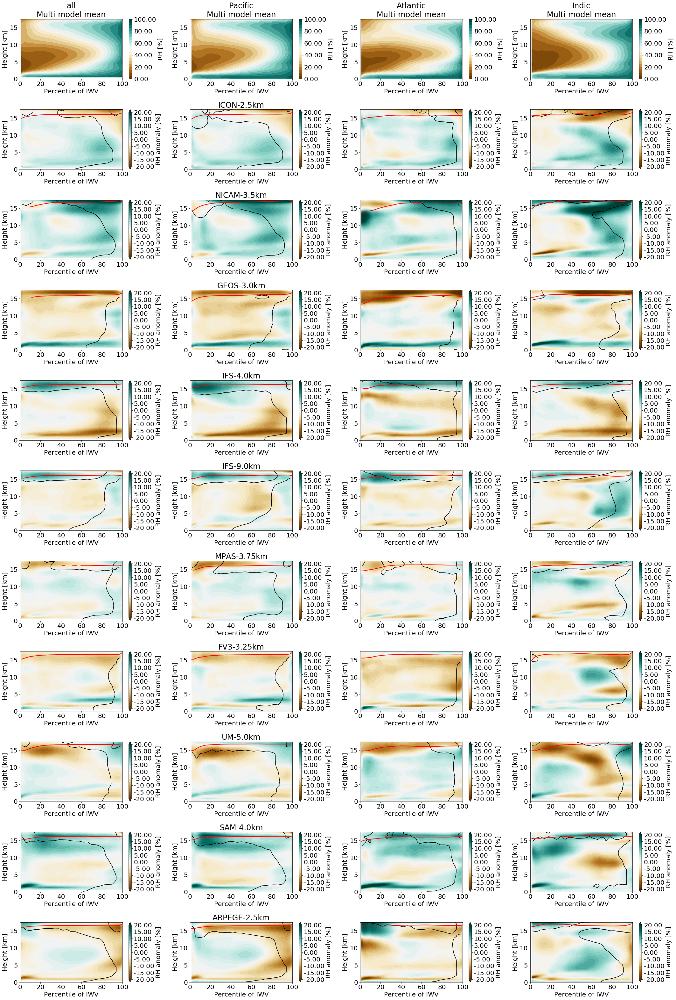

In [109]:
num_cols = 4
num_rows = len(exps) + 1
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))

tick_labels = np.arange(10, 81, 10)

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'

for n, basin in enumerate(['all']+ocean_basins):
    plots.moisture_space_contourf(fig, ax[0, n], reduced_percs_50, h * 1e-3, ms_perc_series[basin]['RH'].reduced_bins(50).T * 1e2, np.arange(0, 101, 5),\
                                  x_lims, y_lims, x_label, y_label, 'RH [%]',
                                  cm_orientation='vertical', cb_extend='neither', cb_ticks=np.arange(0, 101, 20), \
                                  cmap='BrBG', vmin=0, vmax=100)
    ax[0, n].set_title(f'{basin}\nMulti-model mean')
    for i, exp in enumerate(exps):
        plots.moisture_space_contourf(fig, ax[i+1, n], reduced_percs_50, h * 1e-3, (ms_perc[exp][basin]['RH'].reduced_bins(50).T - ms_perc_series[basin]['RH'].reduced_bins(50).T)* 1e2, np.arange(-20, 21, 1),\
                                      x_lims, y_lims, x_label, y_label, 'RH anomaly [%]',
                                      cm_orientation='vertical', cb_extend='both',\
                                      cmap='BrBG', vmin=-20, vmax=20)

        cs = plots.moisture_space_contour(fig, ax[i+1, n], reduced_percs_25, h * 1e-3, ms_perc[exp][basin]['W'].reduced_bins(25).T,\
                                 [0.0], x_lims, y_lims, x_label, y_label, 'k')
        plots.moisture_space_line(ax[i+1, n], reduced_percs_50, ms_perc[exp][basin]['H_tropo'].reduced_bins(50).T * 1e-3,\
                                      x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')
        ax[i+1, 1].set_title(exp)
plt.tight_layout()

# Specific humidity distribution in different ocean basins

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c55bc9048>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c56914400>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c600e3e10>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5b1b1358>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c627a8550>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c6a40dc88>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c63d0d710>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

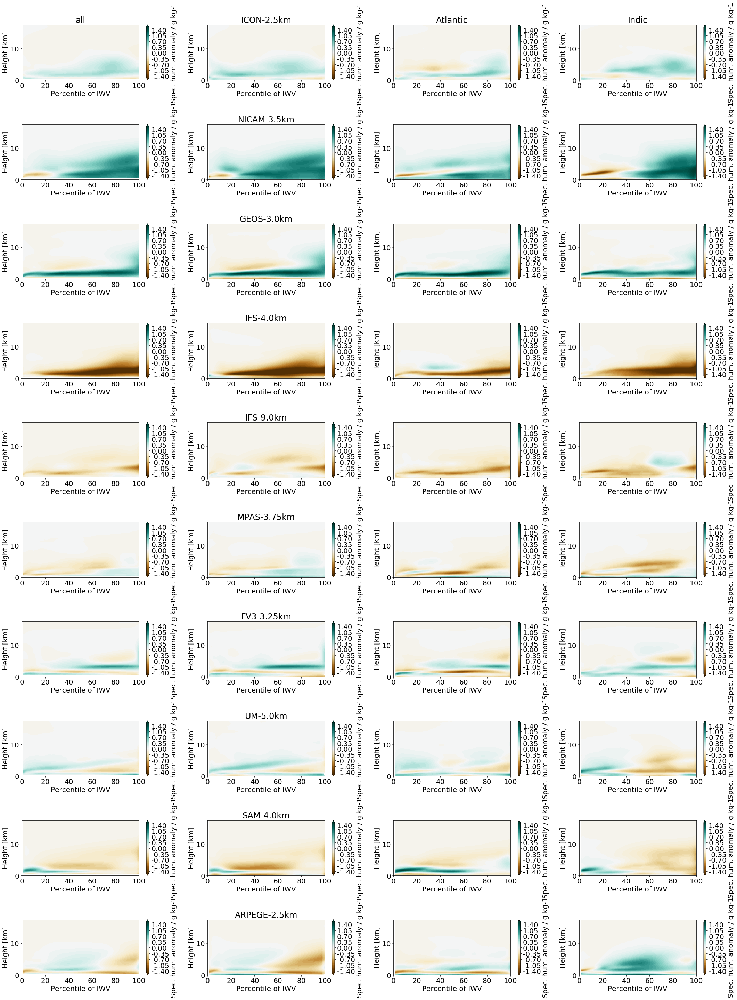

In [206]:
num_cols = 4
num_rows = len(exps)
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))

tick_labels = np.arange(10, 81, 10)

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'
contours = np.arange(-1.5, 1.6, 0.05)

for n, basin in enumerate(['all']+ocean_basins):
    ax[0, n].set_title(basin)
    for i, exp in enumerate(exps):
        plots.moisture_space_contourf(fig, ax[i, n], reduced_percs_50, h * 1e-3, (ms_perc[exp][basin]['QV'].reduced_bins(50).T - ms_perc_series[basin]['QV'].reduced_bins(50).T) * 1e3, contours,\
                                      x_lims, y_lims, x_label, y_label, 'Spec. hum. anomaly / g kg-1',
                                      cm_orientation='vertical', cb_extend='both',\
                                      cmap='BrBG', vmin=contours[0], vmax=contours[-1])
        ax[i, 1].set_title(exp)
plt.tight_layout()

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c63e33588>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c57b52f98>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c61dcadd8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c65557a90>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c603ed7b8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c617c63c8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c6063f2e8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

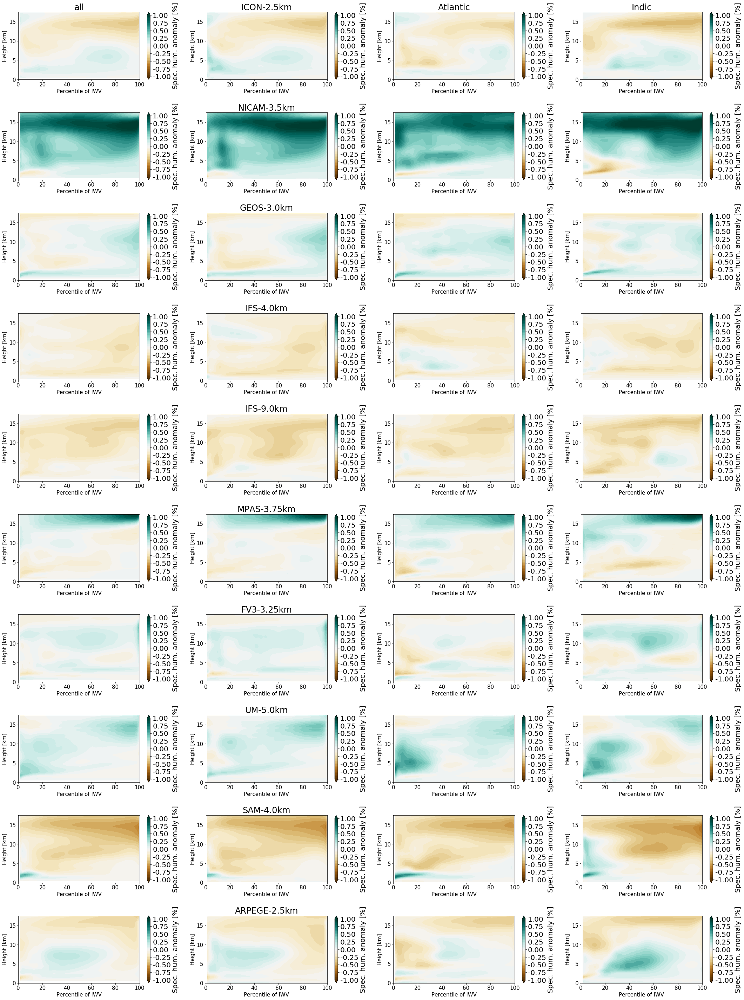

In [198]:
num_cols = 4
num_rows = len(exps)
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))

tick_labels = np.arange(10, 81, 10)

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'
contours = np.arange(-1, 1.01, 0.05)

for n, basin in enumerate(['all']+ocean_basins):
    ax[0, n].set_title(basin)
    for i, exp in enumerate(exps):
        plots.moisture_space_contourf(fig, ax[i, n], reduced_percs_50, h * 1e-3, (ms_perc[exp][basin]['QV'].reduced_bins(50).T - ms_perc_series[basin]['QV'].reduced_bins(50).T) / ms_perc_series[basin]['QV'].reduced_bins(50).T, contours,\
                                      x_lims, y_lims, x_label, y_label, 'Spec. hum. anomaly [%]',
                                      cm_orientation='vertical', cb_extend='both',\
                                      cmap='BrBG', vmin=-1, vmax=1)
        ax[i, 1].set_title(exp)
plt.tight_layout()

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5bece588>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5ab40f60>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c61130160>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c611f6dd8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5b420e48>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c57796978>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c611f9d68>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

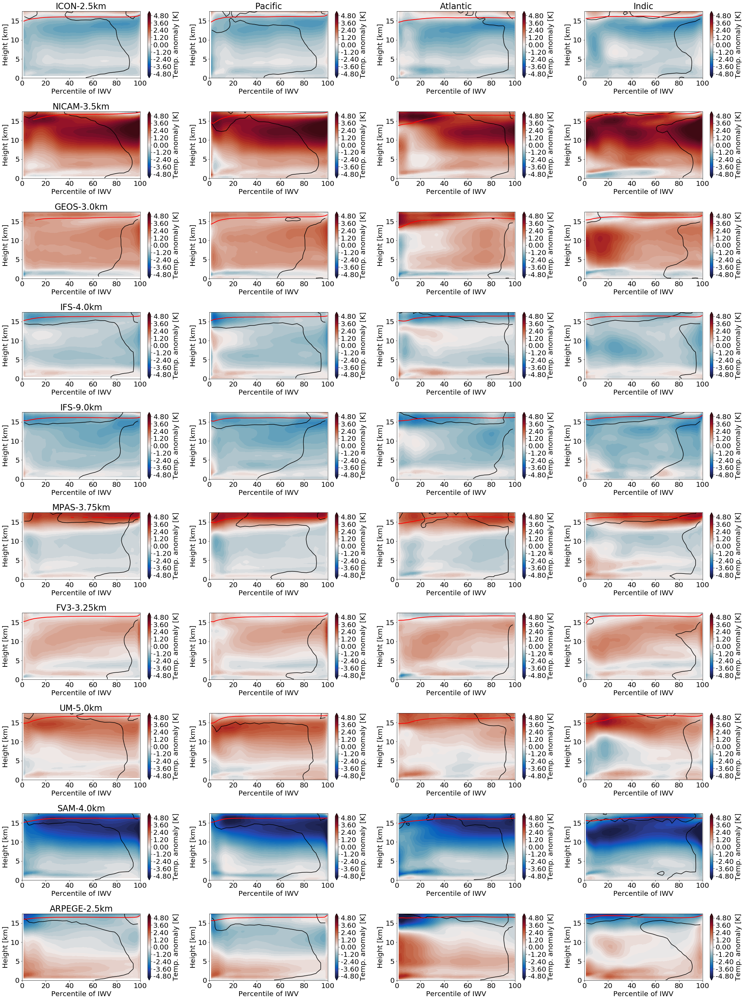

In [113]:
num_cols = 4
num_rows = len(exps)
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))

tick_labels = np.arange(10, 81, 10)

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'
contours = np.arange(-5, 5.1, 0.2)

for n, basin in enumerate(['all']+ocean_basins):
    ax[0, n].set_title(basin)
    for i, exp in enumerate(exps):
        plots.moisture_space_contourf(fig, ax[i, n], reduced_percs_50, h * 1e-3, (ms_perc[exp][basin]['TEMP'].reduced_bins(50).T - ms_perc_series[basin]['TEMP'].reduced_bins(50).T), contours,\
                                      x_lims, y_lims, x_label, y_label, 'Temp. anomaly [K]',
                                      cm_orientation='vertical', cb_extend='both',\
                                      cmap='difference', vmin=-5, vmax=5)

        cs = plots.moisture_space_contour(fig, ax[i, n], reduced_percs_25, h * 1e-3, ms_perc[exp][basin]['W'].reduced_bins(25).T,\
                                 [0.0], x_lims, y_lims, x_label, y_label, 'k')
        plots.moisture_space_line(ax[i, n], reduced_percs_50, ms_perc[exp][basin]['H_tropo'].reduced_bins(50).T * 1e-3,\
                                      x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')
        ax[i, 0].set_title(exp)
plt.tight_layout()

# Vertical velocities in different ocean basins

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c591c7048>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5870f860>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c61d1b588>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c555ab160>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c625a1898>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c557f2198>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c555f59b0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

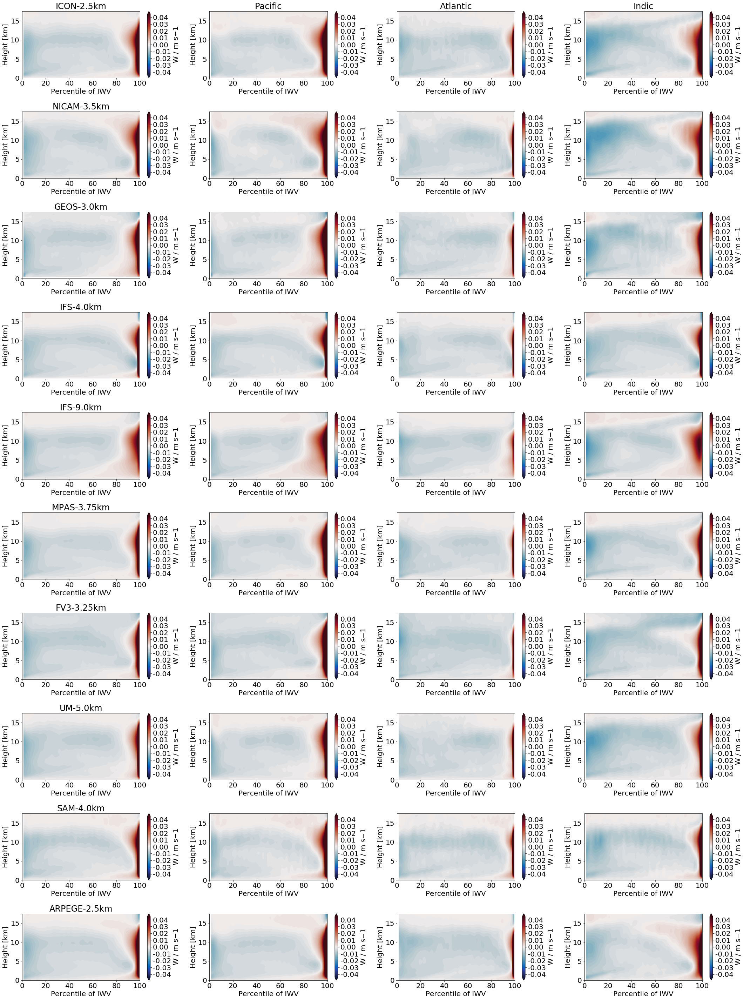

In [128]:
num_cols = 4
num_rows = len(exps)

fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))
tick_labels = np.arange(10, 81, 10)
plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'

contours_w = np.arange(-0.04, 0.040001, 0.001)

for n, b in enumerate(['all']+ocean_basins):
    ax[0, n].set_title(b)
    for i, exp in enumerate(exps):

        plots.moisture_space_contourf(fig, ax[i, n], reduced_percs_50, h * 1e-3, ms_perc[exp][b]['W'].reduced_bins(50).T, contours_w,\
                                      x_lims, y_lims, x_label, y_label, 'W / m s${-1}$',
                                      cm_orientation='vertical', cb_extend='both',\
                                      cmap='difference', vmin=-0.04, vmax=0.04)
        ax[i, 0].set_title(exp)
plt.tight_layout()

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c57cb2128>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c57ad8780>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5705e4a8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c569e9390>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5a2a9518>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c56a7a400>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c59ed5940>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

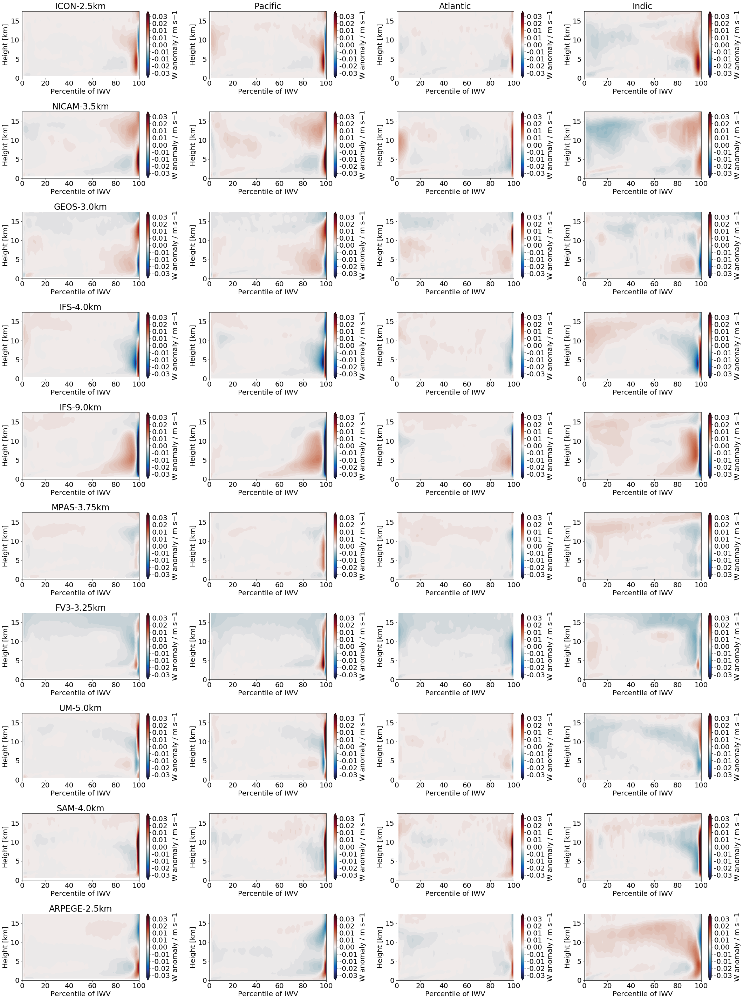

In [120]:
num_cols = 4
num_rows = len(exps)

fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))
tick_labels = np.arange(10, 81, 10)
plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'

contours_w = np.arange(-0.03, 0.030001, 0.001)

for n, b in enumerate(['all']+ocean_basins):
    ax[0, n].set_title(b)
    for i, exp in enumerate(exps):

        plots.moisture_space_contourf(fig, ax[i, n], reduced_percs_50, h * 1e-3, ms_perc[exp][b]['W'].reduced_bins(50).T - ms_perc_series[b]['W'].reduced_bins(50).T, contours_w,\
                                      x_lims, y_lims, x_label, y_label, 'W anomaly / m s${-1}$',
                                      cm_orientation='vertical', cb_extend='both',\
                                      cmap='difference', vmin=-0.03, vmax=0.03)
        ax[i, 0].set_title(exp)
plt.tight_layout()

# Streamfunction in different ocean basins

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c576e5cf8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5770bef0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c570e5160>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c61103c88>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c58a02668>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c56cd99e8>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b4c5a9a9780>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

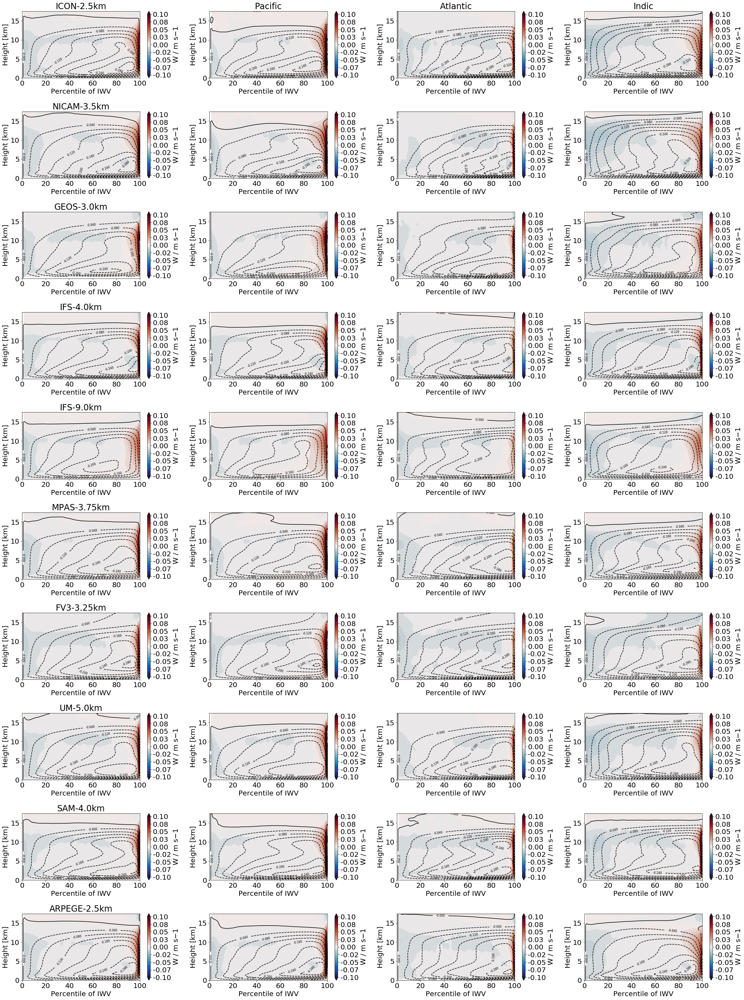

In [172]:
reload(utils)
streamfunction = {}
for exp in exps:
    streamfunction[exp] = {}
    for b in ['all']+ocean_basins:
        streamfunction[exp][b] = np.zeros((num_percs, len(h)))
        density = utils.calc_density_moist_air(
            ms_perc[exp][b]['PRES'].mean,
            ms_perc[exp][b]['TEMP'].mean,
            ms_perc[exp][b]['QV'].mean
        )
#         for i in range(num_percs-1, 0, -1):
#             streamfunction[exp][b][i-1] = streamfunction[exp][b][i] + density[i] * ms_perc[exp][b]['W'].mean[i]
        for i in range(1, num_percs):
            streamfunction[exp][b][i] = streamfunction[exp][b][i-1] + density[i] * ms_perc[exp][b]['W'].mean[i]
        
num_cols = 4
num_rows = len(exps)

fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))
tick_labels = np.arange(10, 81, 10)
plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'

contours = np.arange(-0.4, 0.401, 0.04)
contours_w = np.arange(-0.1, 0.10001, 0.005)

for n, b in enumerate(['all']+ocean_basins):
    ax[0, n].set_title(b)
    for i, exp in enumerate(exps):
        cs = plots.moisture_space_contour(fig, ax[i, n], perc_values, h * 1e-3, streamfunction[exp][b].T,\
                                 contours, x_lims, y_lims, x_label, y_label, 'k')
        plots.moisture_space_contourf(fig, ax[i, n], reduced_percs_50, h * 1e-3, ms_perc[exp][b]['W'].reduced_bins(50).T, contours_w,\
                                      x_lims, y_lims, x_label, y_label, 'W / m s${-1}$',
                                      cm_orientation='vertical', cb_extend='both',\
                                      cmap='difference', vmin=-0.1, vmax=0.1)
        ax[i, n].clabel(cs, fontsize=8)
        ax[i, 0].set_title(exp)
plt.tight_layout()

# IWV PDFs in different time periods

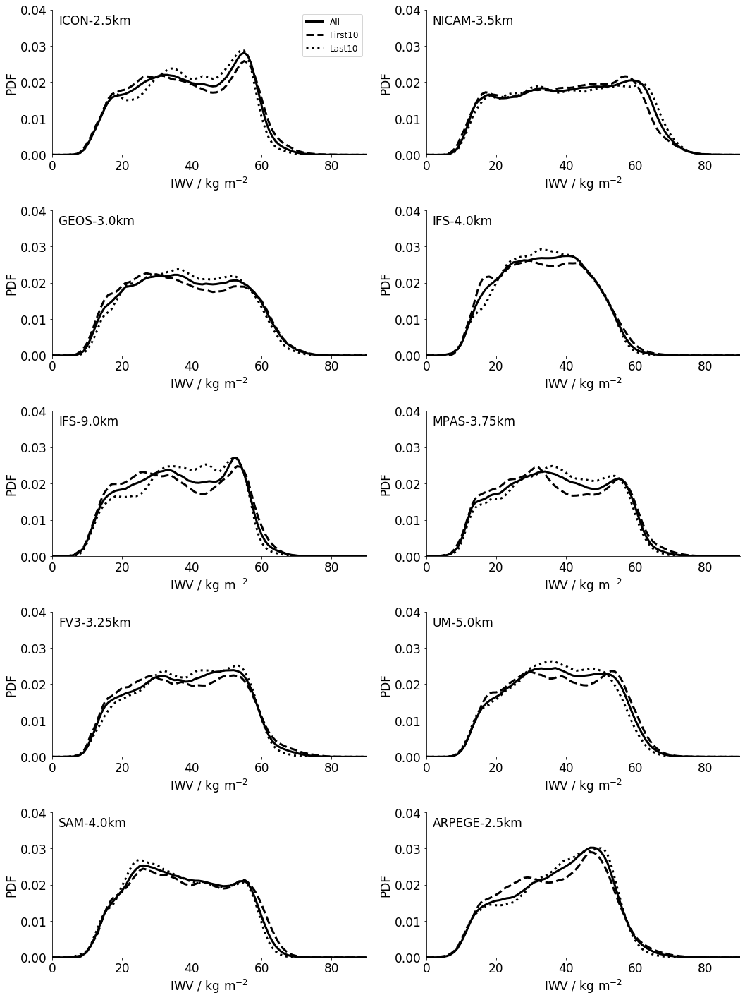

In [62]:
plt.rcParams.update({'font.size': 17})
num_cols = 2
num_rows = np.ceil(len(exps) / num_cols).astype(int)
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))
ax = ax.ravel()
for i, exp in enumerate(exps):
    ax[i].set_prop_cycle(linestyle=['-', '--', ':', '-.'])
    for basin in sample_days:
        iwv_pdf = ms_bins[exp][basin]['IWV'].profile_pdf
        seaborn.despine()
        ax[i].plot(iwv_pdf / np.sum(iwv_pdf), color='k', lw=3, label=basin.title())
        ax[i].set_xlabel('IWV / kg m$^{-2}$')
        ax[i].set_ylabel('PDF')
        ax[i].set_xlim(0, 90)
        ax[i].set_ylim(0, 0.04)
        ax[i].set_xlabel('IWV / kg m$^{-2}$')
        ax[i].set_ylabel('PDF')
ax[0].legend(fontsize=12)
typhon.plots.label_axes(labels=exps)
plt.tight_layout()

# RH distribution in different time periods

DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b89e82bcb70>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b89dff4e940>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b89e024f6a0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b89e01949b0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b89e82d11d0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b89e8015080>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator object at 0x2b89e04939b0>
DEBUG:Using fixed locator on colorbar
DEBUG:Setting pcolormesh
DEBUG:locator: <matplotlib.ticker.FixedLocator o

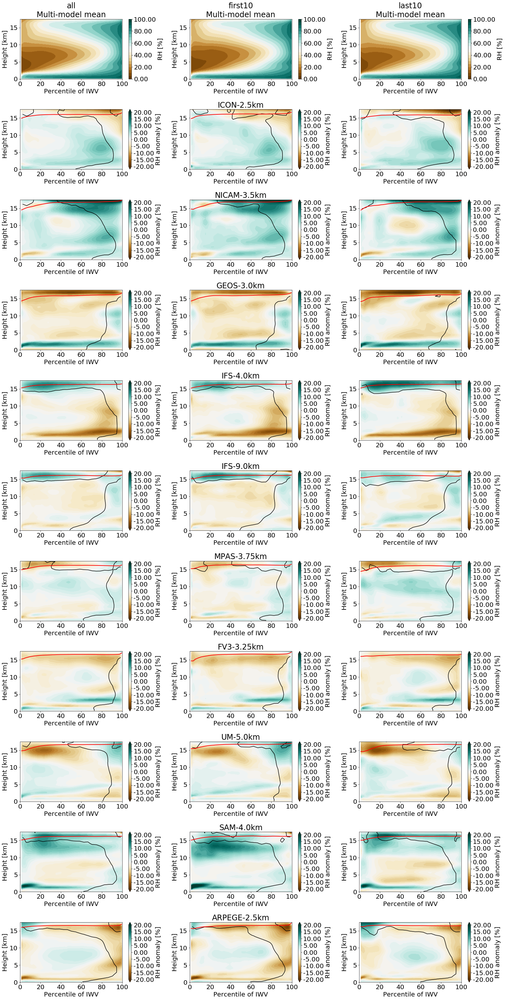

In [8]:
num_cols = 3
num_rows = len(exps) + 1
fig, ax = plt.subplots(num_rows, num_cols, figsize=(7.5 * num_cols, 4 * num_rows))

tick_labels = np.arange(10, 81, 10)

plt.rcParams.update({'font.size': 20})
x_lims = [0, 100]
y_lims = [0, 17.5]
x_label = 'Percentile of IWV'#axis_labels['IWV']
y_label = 'Height [km]'

for n, period in enumerate(sample_days):
    plots.moisture_space_contourf(fig, ax[0, n], reduced_percs_50, h * 1e-3, ms_perc_series[period]['RH'].reduced_bins(50).T * 1e2, np.arange(0, 101, 5),\
                                  x_lims, y_lims, x_label, y_label, 'RH [%]',
                                  cm_orientation='vertical', cb_extend='neither', cb_ticks=np.arange(0, 101, 20), \
                                  cmap='BrBG', vmin=0, vmax=100)
    ax[0, n].set_title(f'{period}\nMulti-model mean')
    for i, exp in enumerate(exps):
        plots.moisture_space_contourf(fig, ax[i+1, n], reduced_percs_50, h * 1e-3, (ms_perc[exp][period]['RH'].reduced_bins(50).T - ms_perc_series[period]['RH'].reduced_bins(50).T)* 1e2, np.arange(-20, 21, 1),\
                                      x_lims, y_lims, x_label, y_label, 'RH anomaly [%]',
                                      cm_orientation='vertical', cb_extend='both',\
                                      cmap='BrBG', vmin=-20, vmax=20)

        cs = plots.moisture_space_contour(fig, ax[i+1, n], reduced_percs_25, h * 1e-3, ms_perc[exp][period]['W'].reduced_bins(25).T,\
                                 [0.0], x_lims, y_lims, x_label, y_label, 'k')
        plots.moisture_space_line(ax[i+1, n], reduced_percs_50, ms_perc[exp][period]['H_tropo'].reduced_bins(50).T * 1e-3,\
                                      x_lims, y_lims, x_label, y_label, lw=2, label=m, color='r')
        ax[i+1, 1].set_title(exp)
plt.tight_layout()